# The Fourier Transform
## December 9th, 2021
### Overview: Implementations of the Fourier Transform on audio files

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [1]:
from matplotlib import pyplot as plt
import numpy as np
from scipy.io import wavfile
import IPython
from scipy.fftpack import fft, ifft, fft2, ifft2
from scipy.signal import fftconvolve
import time
import imageio

In [2]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect 

In [3]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        self.rate = rate
        self.samples = samples

    # Problems 1.1 and 1.7
    def plot(self,freq=False,color="g"):
        """Plot the graph of the sound wave (time versus amplitude)."""
        #getting time and setting ticks
        T = len(self.samples)/rate
        times = np.arange(0,round(T)+0.25,step=0.25)
        
        #plotting samples
        if freq == False:
            plt.xticks(ticks = np.linspace(0,len(self.samples),9),labels=times)
            plt.ylim(-32768,32767)
            plt.ylabel("Amplitude")
            plt.xlabel("Time")
            plt.title("Amplitude vs. Time")
            plt.plot(self.samples,color=color)
            
        else:
            #doing frequency conversion
            DFT = fft(self.samples)
            DFT = DFT[:len(DFT)//2]
            ticks = [k * self.rate / len(self.samples) for k in range(len(DFT))]
            
            
            #plotting DFT for frequencies
            plt.xlabel("Frequency (Hz)")
            plt.ylabel("Magnitude")
            plt.title("Magnitude vs. Frequency")
            
            plt.plot(ticks,np.abs(DFT),color=color)

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        #if type is not np.int16 or if force is true, scale the samples
        if type(self.samples[0]) != np.int16 or force == True:
            self.samples = np.int16(self.samples * (32767 / np.max(np.abs(self.samples))))
            
        wavfile.write(filename,self.rate,self.samples)
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        #checking for errors
        if len(self.samples) != len(other.samples):
            raise ValueError("Sample arrays are not the same length")
        if self.rate != other.rate:
            raise ValueError("SoundWave objects do not share rate")
        
        #if all clear, add samples and create new SoundWave object
        sampSum = self.samples + other.samples
        soundSum = SoundWave(self.rate,sampSum)
        return soundSum

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.
        Returns:
            (SoundWave): A new SoundWave instance with the concatenated samples.
            
        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #checking errors
        if self.rate != other.rate:
            raise ValueError("Sample rates are not equal")
            
        #otherwise concatenating
        concatSamp = np.concatenate((self.samples,other.samples))
        concatSound = SoundWave(self.rate,concatSamp)
        return concatSound
        
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #comparing sample rates
        if self.rate != other.rate:
            raise ValueError("sample rates are not equal")
        
        #getting the same amount of samples
        size = max(len(self.samples),len(other.samples))
        #pad 1
        p1 = np.zeros(size - len(self.samples))
        s1 = np.concatenate((self.samples,p1))
        #pad 2
        p2 = np.zeros(size - len(other.samples))
        s2 = np.concatenate((other.samples,p2))
        
        #convolving
        convolved = ifft( fft(s1) * fft(s2) )
        newSound = SoundWave(self.rate, convolved)
        
        return newSound

    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #comparing sample rates
        if self.rate != other.rate:
            raise ValueError("sample rates are not equal")
            
        #sample lengths
        n = len(self.samples)
        m = len(other.samples)
        
        #finding a such that 2^a >= n + m - 1
        add = n + m - 1
        a = 0
        while (2**a) < add:
            a += 1
        
        #padding with zeros to be 2^a length
        p1 = np.zeros( (2**a) - n  )
        p2 = np.zeros( (2**a) - m )
        s1 = np.concatenate((self.samples,p1))
        s2 = np.concatenate((other.samples,p2))
        
        #print('a =',a)
        #print('n =',n)
        #print('m =',m)
        #print('2^a =',2**a)
        #print('n1 =',len(s1))
        #print('m1 =',len(s2))
        
        #linear convolution
        convolved = ifft( fft(self.samples) * fft(other.samples) )[:n+m]
        newSound = SoundWave(self.rate,convolved)
        
        return newSound

    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        #n is the number of samples, dft is the dft of the samples
        n = len(self.samples)
        dft = fft(self.samples)
        
        #getting k indices
        k_l = low_freq * n//self.rate
        k_h = high_freq *n//self.rate
        
        #cleaning out undesired frequencies
        for k in range(k_l,k_h+1):
            dft[k] = 0
        for k in range(n-k_h,n-k_l+1):
            dft[k] = 0
        
        #inverting and resetting self.samples to be cleaned
        cleaned = ifft(dft).real
        self.samples = cleaned

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavfile.read()` and the `SoundWave` class to plot `tada.wav`.

In [4]:
#getting rate and samples of tada
rate, samples = wavfile.read("tada.wav")

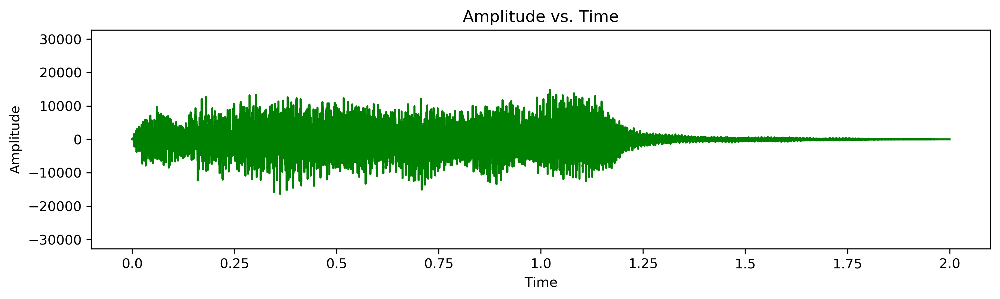

In [5]:
#plotting tada
tada = SoundWave(rate, samples)
tada.plot()

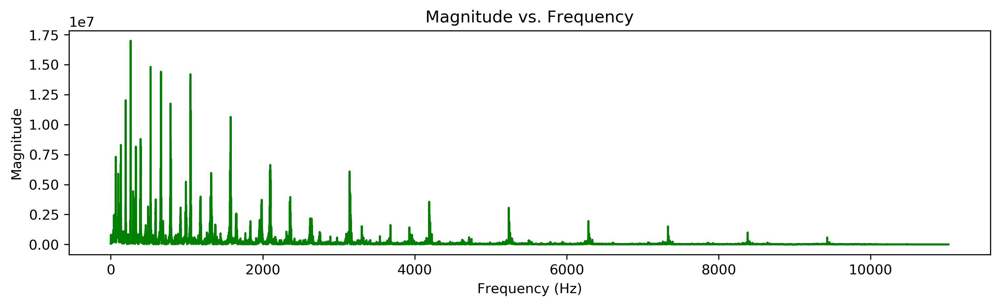

In [6]:
#plotting tada's dft
tada.plot(freq=True)

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [7]:
#default audio
IPython.display.Audio(filename='tada.wav')

In [8]:
#exported audio
tada.export('tada_export.wav')
IPython.display.Audio(filename='tada_export.wav')

In [9]:
#scaled (forced) audio
tada.export('tada_scaled.wav',force=True)
IPython.display.Audio(filename='tada_scaled.wav')

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [10]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    #the desired rate is 44100
    rate = 44100
    
    #delta is the spacing between the samples, and x is the duration-length linspace
    delta = rate*duration
    x = np.linspace(0,duration,delta)
    
    #constructing the wave and its corresponding SoundWave object
    wave = np.sin(2 * np.pi * frequency * x)
    sound = SoundWave(rate,wave)
    return sound

In [11]:
#generating and playing a 2-second A-note sound wave
A = generate_note(440,2)
A.export('A_Note.wav',force=True)
IPython.display.Audio(filename='A_Note.wav')

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [12]:
#constructing the A,C, and E 3-second notes
A_3sec = generate_note(440,3)
C_3sec = generate_note(523.25,3)
E_3sec = generate_note(659.25,3)

#Constructing and playing A_minor chord
A_minor = A_3sec + C_3sec + E_3sec
A_minor.export('A_minor.wav')
IPython.display.Audio(filename='A_minor.wav')

In [13]:
#constructing the A,C, and E 3-second notes
A_1sec = generate_note(440,1)
C_1sec = generate_note(523.25,1)
E_1sec = generate_note(659.25,1)

#Constructing and playing A_minor chord
arpeggio = A_1sec >> C_1sec >> E_1sec
arpeggio.export('arpeggio.wav')
IPython.display.Audio(filename='arpeggio.wav')

### Problem 1.5

- Implement `simple_dft()` with the formula $c=F_nf$, where $F_n$ is the n-dimensional DFT matrix.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [14]:
"""I know there's a really short way to do all of this given in the book, but it was fun to make"""

def calc_w_nk(n,k):
    """This function accepts integers n and k and returns (ω_n)^k"""
    #  e^2piik/n
    wnk = np.exp(2*np.pi * 1j * 1/n * k)
    
    #separating the real and imaginary parts to check for zeros
    real = np.real(wnk)
    imag = np.imag(wnk)
    
    #checking for zeros and setting accordingly
    tol = 1e-14
    if abs(real) < tol:
        wnk = 0 + imag*1j
    elif abs(imag) < tol:
        wnk = real + 0*1j
    
    #returning (ω_n)^k
    return wnk

def vec_w_nk(n,row):
    """This function accepts an integer n and a row index and returns the (w_n)^k row vector"""
    #initializing vector
    vec = []
    
    #calculating each (ω_n)^-k while multiplying k by the row index
    for k in range(n):
        w = calc_w_nk(n,-k*row)
        vec.append(w)
    
    #converting into numpy array and returning
    vec = np.array(vec)
    return vec

def Wn_matrix(n):
    """This function accepts and integer n and returns the corresponding DFT matrix Wn"""
    #initializing Wn
    Wn = []
    
    #getting each row of the matrix and appending
    for row in range(n):
        vec = vec_w_nk(n,row)
        Wn = Wn + [vec]
        
    #converting into numpy array/matrix and returning matrix divided by n
    Wn = np.array(Wn)
    return Wn/n

def DFT(f):
    """This function accepts a numpy array f and returns its Fourier transform"""
    n = len(f)
    return Wn_matrix(n)@f

In [68]:
W = 6*Wn_matrix(6)@np.array([0,1,-1,0,-1,1])

In [69]:
W

array([ 0.00000000e+00+0.00000000e+00j,  2.00000000e+00+6.66133815e-16j,
       -1.38777878e-15+0.00000000e+00j, -4.00000000e+00+0.00000000e+00j,
        3.10862447e-15-6.66133815e-16j,  2.00000000e+00+3.88578059e-15j])

In [15]:
print(Wn_matrix(3)*3)

[[ 1. +0.j         1. +0.j         1. +0.j       ]
 [ 1. +0.j        -0.5-0.8660254j -0.5+0.8660254j]
 [ 1. +0.j        -0.5+0.8660254j -0.5-0.8660254j]]


In [16]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    return DFT(samples)

In [17]:
#Comparing my dft function with scipy's
f = np.array([1,6,2,4])
print(np.allclose(4*simple_dft(f),fft(f)))
print('')
g = np.random.random(100)
print(np.allclose(100*simple_dft(g),fft(g)))

True

True


### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [18]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    #doing split algorithm
    def SPLIT(g):
        n = len(g)
        if n <= threshold:
            #if n small enough, use simple_dft
            return n*simple_dft(g)
        else:
            #get DFT of every other entry of g, starting from zero
            even = SPLIT(g[::2])
            
            #get DFT of every other entry of g, starting from one
            odd = SPLIT(g[1::2])
            z = []
            for k in range(n):
                #using my function to calculate the exponential parts of the sum
                z = z + [calc_w_nk(n,-k)]
            z = np.array(z)
            
            #getting middle index of z
            m = n // 2
            
            #concatenating and returning the two arrays of length m
            return np.concatenate(( even + np.multiply(z[:m],odd), even + np.multiply(z[m:],odd)  ))
    
    return SPLIT(samples)/len(samples)

In [19]:
#testing they're close together
big_array = np.random.random(8192)
np.allclose(8192*simple_fft(big_array),fft(big_array))

True

In [21]:
out = %time simple_fft(big_array)

CPU times: user 2.39 s, sys: 15.6 ms, total: 2.41 s
Wall time: 2.4 s


In [23]:
###########
#  My simple_fft comes out at about 750 ms
#
#  fftpack.fft comes out at about 130 µs
#

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

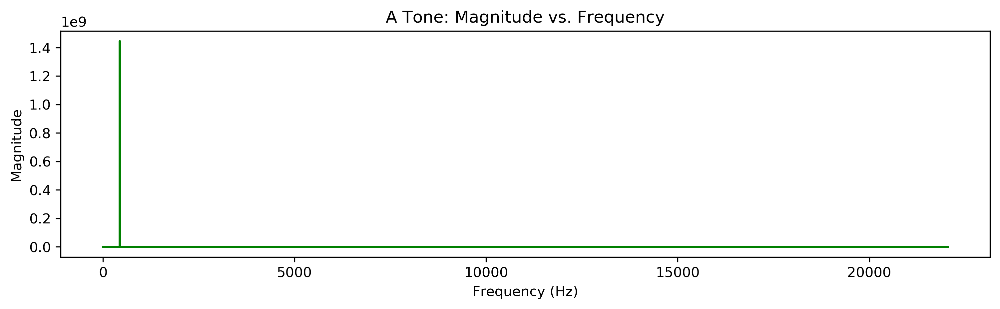

In [24]:
#Plotting A tone's DFT
A.plot(freq=True)
title = plt.title("A Tone: Magnitude vs. Frequency")

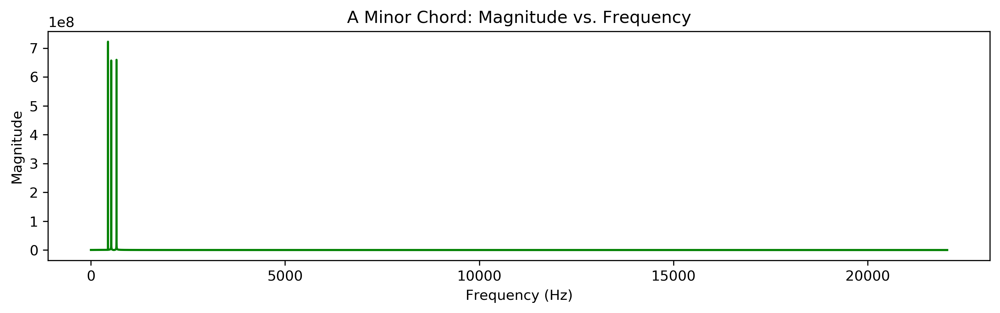

In [25]:
#Plotting A minor's DFT
A_minor.plot(freq=True)
title = plt.title("A Minor Chord: Magnitude vs. Frequency")

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

In [26]:
#getting the rate and samples of the mystery chord
rate2, samples2 = wavfile.read("mystery_chord.wav")

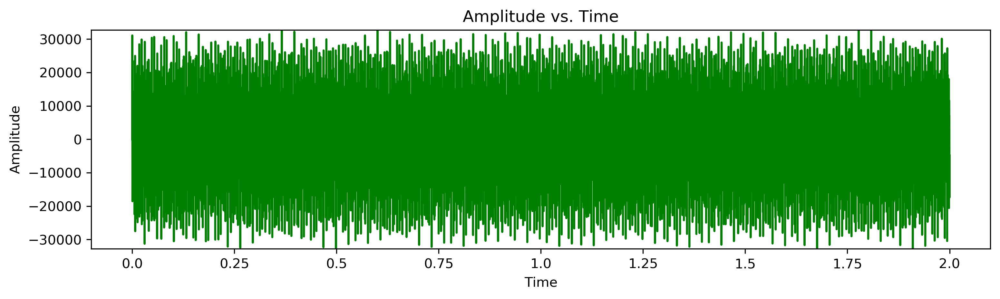

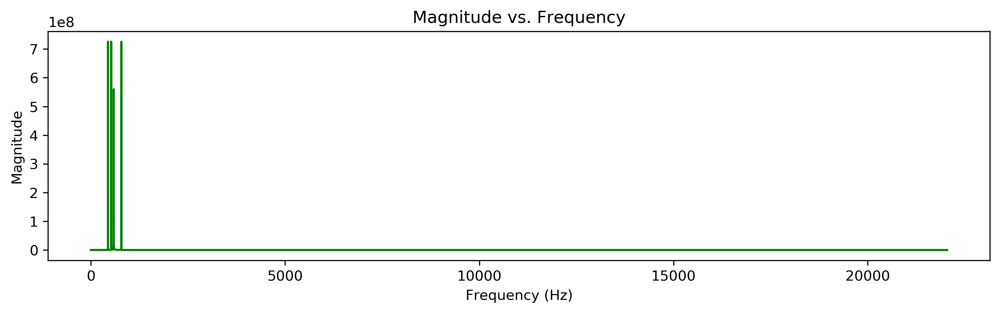

In [27]:
#plotting the mystery soundwave's amplitudes and DFT
myst = SoundWave(rate2, samples2)
myst.plot()
plt.show()
myst.plot(True)

In [28]:
#getting the 
MysteryDFT = fft(samples2)
MysteryDFT = np.abs(MysteryDFT[:len(MysteryDFT)//2])

inds = np.argsort(-MysteryDFT)[:4]
print("The indices of maximum magnitude are")
print(inds)

The indices of maximum magnitude are
[1760 3136 2093 2350]


In [29]:
#listing all the frequencies and doing the transformations
freqs = [k * rate2 / len(samples2) for k in range(len(samples2))]

In [30]:
#making a list, big_freaks, of the biggest frequencies
big_freqs = []
for ind in inds:
    big_freqs.append(freqs[ind])

print("The three frequencies of largest magnitude are")
print(big_freqs)

The three frequencies of largest magnitude are
[440.0, 784.0, 523.25, 587.5]


In [31]:
#Generating the notes of the frequencies
notes = []
for big in big_freqs:
    notes.append(generate_note(big,4))

#Adding the notes together
Note = notes[0]
for note in notes[1:]:
    Note += note

In [32]:
#it sounds the same hooray
Note.export('is_Note.wav')
IPython.display.Audio(filename='is_Note.wav')

In [33]:
IPython.display.Audio(filename='mystery_chord.wav')

The notes are A:440.0Hz, G:784.0Hz, C:523.25Hz, and D:587.5Hz

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [34]:
#creating white noise
white_noise = np.random.randint(-32767, 32767, tada.rate*2, dtype=np.int16)
white_noise = SoundWave(tada.rate,white_noise)

#exporting and playing white noise for my own enjoyment
white_noise.export('white.wav')
IPython.display.Audio(filename='white.wav')

In [35]:
#convolving tada and white noise
convolve = tada * white_noise
convolve.export('convolve.wav')
IPython.display.Audio(filename='convolve.wav')

/home/zane/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: ComplexWarning: Casting complex values to real discards the imaginary part


In [36]:
appended = convolve >> convolve
appended.export('appended.wav')
IPython.display.Audio(filename='appended.wav')

### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [37]:
#reading the wave files
rateC, samplesC = wavfile.read("CGC.wav")
rateG, samplesG = wavfile.read("GCG.wav")

n = len(samplesC)
m = len(samplesG)

#creating soundwave objects
CGC = SoundWave(rateC,samplesC)
GCG = SoundWave(rateG,samplesG)

In [38]:
#timing the power magic method
out1 = %time CGC**GCG

#comes out at an average of about 54.9 ms

CPU times: user 31.2 ms, sys: 15.6 ms, total: 46.9 ms
Wall time: 33.1 ms


In [39]:
#timing scipy's fftconvolve
out2 = %time fftconvolve(CGC,GCG)

#comes out at an average of about 11.75 ms

CPU times: user 31.2 ms, sys: 0 ns, total: 31.2 ms
Wall time: 17.2 ms


In [40]:
#playing first original file CGC
IPython.display.Audio(filename='CGC.wav')

In [41]:
#playing second original audio file GCG
IPython.display.Audio(filename='GCG.wav')

In [42]:
#embedding and playing the power magic method's result
out1.export('__pow__.wav')
IPython.display.Audio(filename='__pow__.wav')

/home/zane/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: ComplexWarning: Casting complex values to real discards the imaginary part


In [43]:
#embedding and playing fftconvolve's result
out2.export('fftconvolve.wav')
IPython.display.Audio(filename='fftconvolve.wav')

/home/zane/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: ComplexWarning: Casting complex values to real discards the imaginary part


### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [44]:
#chopin 
chopin_rate, chopin_samp = wavfile.read('chopin.wav')
chopin = SoundWave(chopin_rate,chopin_samp)

#playing
IPython.display.Audio(filename='chopin.wav')

In [45]:
#balloon
ball_rate, ball_samp = wavfile.read('balloon.wav')
balloon = SoundWave(ball_rate,ball_samp)

#playing
IPython.display.Audio(filename='balloon.wav')

In [46]:
#convolving the two
echo = fftconvolve(chopin,balloon)

#playing
echo.export('echo.wav')
IPython.display.Audio(filename='echo.wav')

/home/zane/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: ComplexWarning: Casting complex values to real discards the imaginary part


### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [47]:
#reading the respective files 
rateN1, samplesN1 = wavfile.read('noisy1.wav')
rateN2, samplesN2 = wavfile.read('noisy2.wav')

#creating the soundwave objects
noisy1 = SoundWave(rateN1, samplesN1)
noisy2 = SoundWave(rateN2, samplesN2)

#playing noisy1
IPython.display.Audio(filename='noisy1.wav')

In [48]:
#cleaning noisy1 and playing
noisy1.clean(1250,2600)
noisy1.export('noisy1_clean.wav')
IPython.display.Audio('noisy1_clean.wav')

In [49]:
#playing noisy2
IPython.display.Audio('noisy2.wav')

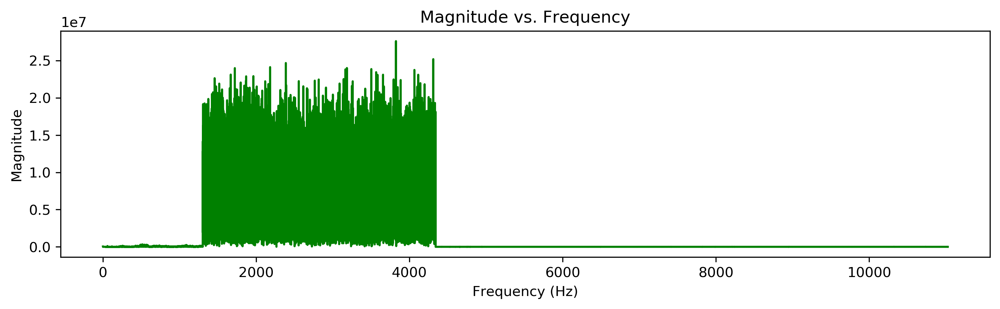

In [50]:
#plotting the dft of noisy2
noisy2.plot(True)

#it looks to me to be between the frequencies 1280 and 4380 Hz

In [51]:
#cleaning and playing noisy2
noisy2.clean(1280,4380)
noisy2.export('noisy2_clean.wav')
IPython.display.Audio('noisy2_clean.wav')

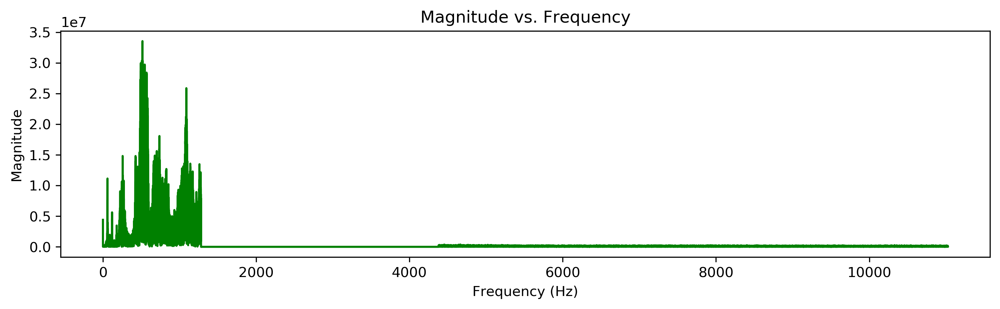

In [52]:
#plotting cleaned dft of noisy2
noisy2.plot(True)

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [53]:
#reading the vuvuzela file and separating the left and right soundss
Rvuvu, Svuvu = wavfile.read('vuvuzela.wav')
left = Svuvu.T[0]
right = Svuvu.T[1]

#making them into separate objects
left = SoundWave(Rvuvu,left)
right = SoundWave(Rvuvu,right)

#cleaning them
left.clean(200,500)
right.clean(200,500)

#recombining
cleaned = np.vstack((left.samples,right.samples)).T
cleaned = SoundWave(Rvuvu,cleaned)
cleaned.export('clean_vuvu.wav')
IPython.display.Audio(filename='clean_vuvu.wav')

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

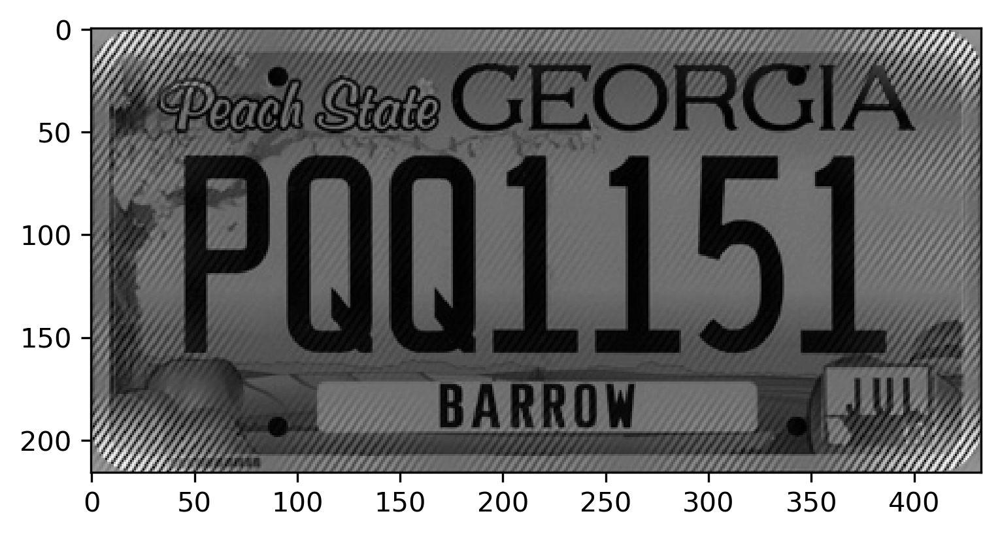

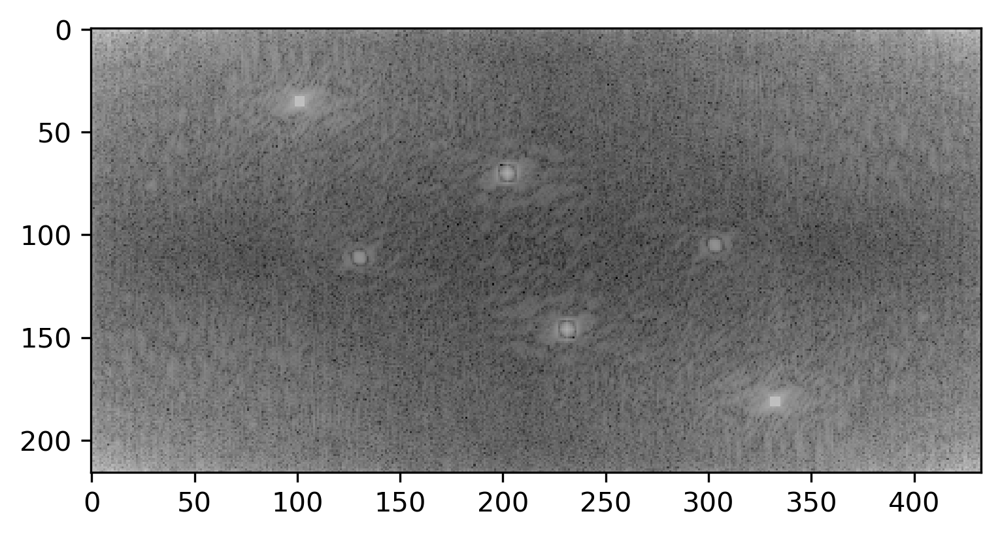

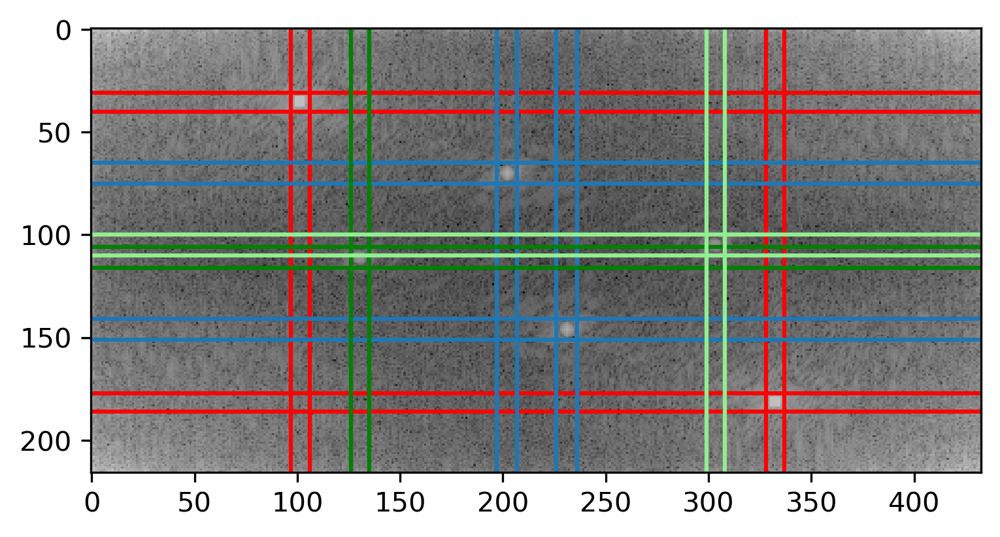

In [54]:
#showing the noisy license plate and the log of its dft
plate = imageio.imread("license_plate.png")
plt.imshow(plate,cmap='gray')
plt.show()
#dft
dft = fft2(plate)
plt.imshow(np.log(np.abs(dft)),cmap='gray')
plt.show()

#now plotting the dft, isolating the bright spots
#SPOTS LISTED IN DESCENDING ORDER OF BRIGHTNESS; GROUPED BY SYMMETRIC PAIR
plt.imshow(np.log(np.abs(dft)),cmap='gray')

#spot at [97,105]X[31,40]
plt.axvline(x=97,color='r')
plt.axvline(x=106,color='r')
plt.axhline(y=31,color='r')
plt.axhline(y=40,color='r')

#spot at [328,336]X[177,185]
plt.axvline(x=328,color='r')
plt.axvline(x=337,color='r')
plt.axhline(y=177,color='r')
plt.axhline(y=186,color='r')

#spot at [197,207]X[65,75]
plt.axvline(x=197)
plt.axvline(x=207)
plt.axhline(y=65)
plt.axhline(y=75)

#spot at [226,236]X[141,151]
plt.axvline(x=226)
plt.axvline(x=236)
plt.axhline(y=141)
plt.axhline(y=151)

#spot at [126,135]X[106,116]
plt.axvline(x=126,color='g')
plt.axvline(x=135,color='g')
plt.axhline(y=106,color='g')
plt.axhline(y=116,color='g')

#spot at [299,308]X[100,110]
plt.axvline(x=299,color='lightgreen')
plt.axvline(x=308,color='lightgreen')
plt.axhline(y=100,color='lightgreen')
plt.axhline(y=110,color='lightgreen')


plt.show()

In [55]:
#the patch / mean of the dft
patch = np.mean(dft)

#seeting each spot to be the value of the patch mean
dft[31:40,97:106]    = patch
dft[177:186,328:337] = patch
dft[64:76,197:209]   = patch
dft[140:152,226:238] = patch
dft[106:116,126:135] = patch
dft[100:110,299:308] = patch

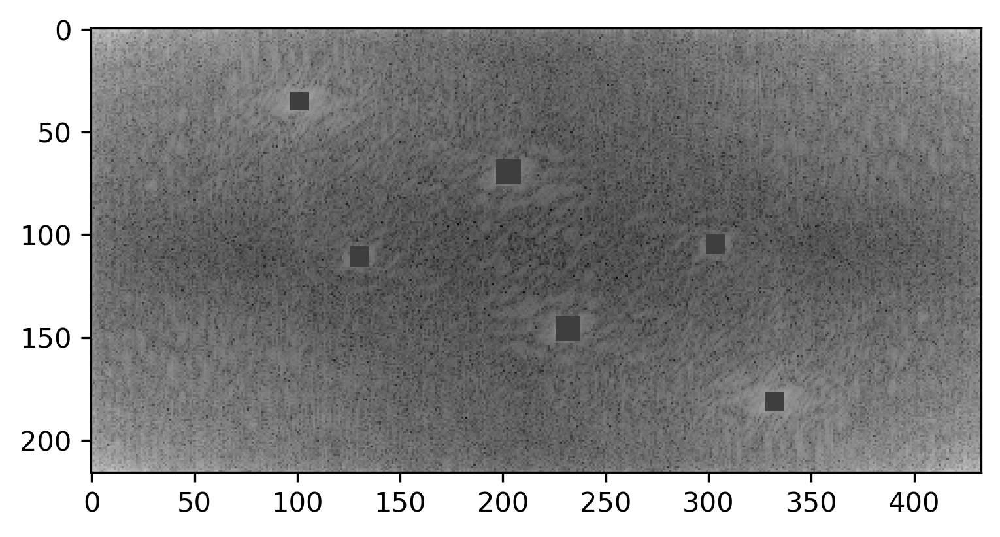

In [56]:
#showing the patch dft
plt.imshow(np.log(np.abs(dft)),cmap='gray')

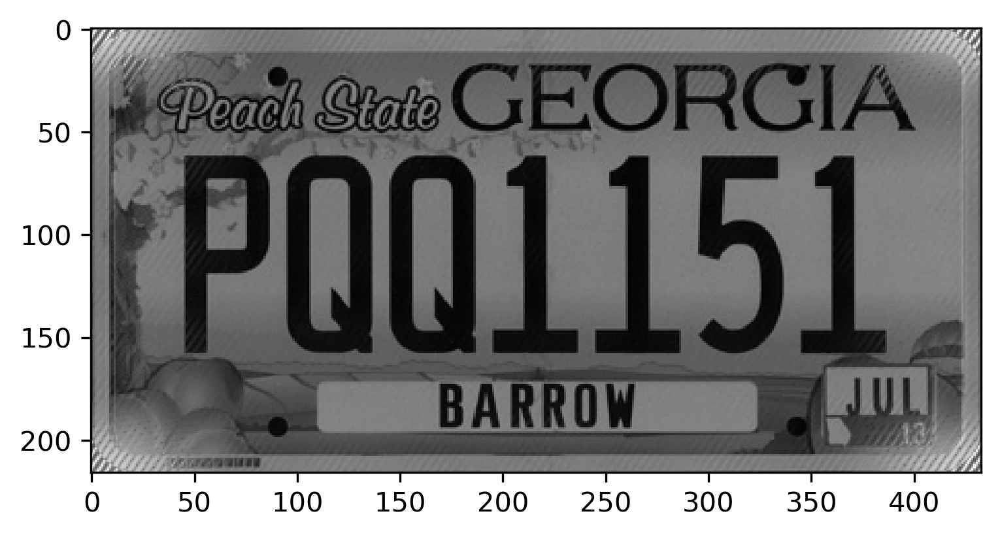

In [57]:
#showing the cleaned image
cleaned_plate = ifft2(dft).real
plt.imshow(cleaned_plate,cmap='gray')

The year on the sticker is... 2013